# Computer Vision (PG) 2025 Assignment 2: feature matching, model fitting, and image retrieval

In this assignment, you will experiment with image feature detectors, descriptors and matching. There are 3 main components in this assignment:

- Matching an object in a pair of images
- Searching for an object in a collection of images
- Results analysis and discussion

## General instructions

As before, you will use this notebook to run your code and display your results and analysis. Again we will mark a PDF conversion of your notebook, checking to your code if necessary, so you should ensure your code output is formatted neatly.

***When converting to PDF, include the outputs and analysis only, not your code.*** You can do this from the command line using the `nbconvert` command (installed as part of Jupyter) as follows:

    jupyter nbconvert Assignment_2_Notebook.ipynb --to pdf --no-input --TagRemovePreprocessor.remove_cell_tags 'remove-cell'

This will also remove the preamble text from each question. It has been packaged into a small notebook you can run in colab, called `notebooktopdf.ipynb` and enclosed in the repository.


We will use the `OpenCV` library to complete the assignment. It has several builtin functions are useful. You are expected to consult OpenCV documentation in order to use it appropriately.

As with the last assignment it is somewhat up to you how you answer each question. Ensure that the outputs and report are clear and easy to read so that the markers can rapidly assess what you have done, how you derived your answers, and how deep is your understanding. This includes:

- sizing, arranging and captioning image outputs appropriately
- explaining what you have done clearly and concisely
- clearly separating answers to each question

## Data

We have provided some example images for this assignment, available through a link on the MyUni assignment page. The images are organised by subject, with one folder containing images of book covers, one of museum exhibits, and another of urban landmarks. You should copy these data into a directory `A2_smvs`, keeping the directory structure the same as in the zip file.  

Within each category (within each folder), there is a “Reference” folder containing a clean image of each object and a “Query” folder containing images taken on a mobile device. Within each category, images with the same name contain the same object (so 001.jpg in the Reference folder contains the same book as 001.jpg in the Query folder).
The data is a subset of the Stanford Mobile Visual Search Dataset which is available at

<http://web.cs.wpi.edu/~claypool/mmsys-dataset/2011/stanford/index.html>.

The full data set contains more image categories and more query images of the objects we have provided, which may be useful for your testing!

> Do not submit your own copy of the data or rename any files or folders! For marking, we will assume the datasets are available in subfolders of the working directory using the same folder names provided.

## Code

Here is some general setup code, which you can edit to suit your needs.

You may choose to implement the code in a supporting file called `a2code.py` to reduce the overall length of the notebook for clarity. If you choose so, please call your code in `a2code.py` and display outputs in this notebook.

You do not necessarily need to use Google Colab for this assignment, however, if your PC is slow to process this assignment, you may consider using Colab and need the following commands.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!pwd
%cd drive/MyDrive/Colab\ Notebooks
!pwd

In [3]:
!pip  install opencv-python

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
   ---------------------------------------- 0.0/39.0 MB ? eta -:--:--
    --------------------------------------- 0.5/39.0 MB 2.8 MB/s eta 0:00:14
   - -------------------------------------- 1.0/39.0 MB 2.5 MB/s eta 0:00:16
   - -------------------------------------- 1.6/39.0 MB 2.5 MB/s eta 0:00:16
   -- ------------------------------------- 2.1/39.0 MB 2.6 MB/s eta 0:00:15
   -- ------------------------------------- 2.9/39.0 MB 2.8 MB/s eta 0:00:14
   --- ------------------------------------ 3.4/39.0 MB 2.6 MB/s eta 0:00:14
   ---- ----------------------------------- 3.9/39.0 MB 2.7 MB/s eta 0:00:13
   ---- ----------------------------------- 4.7/39.0 MB 2.8 MB/s eta 0:00:13
   ----- ---------------------------------- 5.2/39.0 MB 2.8 MB/s eta 0:00:13
   ------ --------------------------------- 6.0/39.0 MB 2.8 MB/s eta 0:00:12
   ------ --------------------------------- 6.8/39.0 MB 2.9 MB/s eta 0:00:12
   -------

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
audio-recorder-streamlit 0.0.10 requires altair<5, but you have altair 5.5.0 which is incompatible.
gensim 4.3.3 requires numpy<2.0,>=1.18.5, but you have numpy 2.2.6 which is incompatible.
numba 0.60.0 requires numpy<2.1,>=1.22, but you have numpy 2.2.6 which is incompatible.


In [1]:
# Numpy is the main package for scientific computing with Python.
import numpy as np
import cv2
from helper_functions import draw_outline, draw_inliers

# Matplotlib is a useful plotting library for python
import matplotlib.pyplot as plt
# This code is to make matplotlib figures appear inline in the
# notebook rather than in a new window.
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots, can be changed
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# Some more magic so that the notebook will reload external python modules;
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

In [7]:
def draw_outline(ref, query, model):
    """
        Draw outline of reference image in the query image.
        This is just an example to show the steps involved.
        You can modify to suit your needs.
        Inputs:
            ref: reference image
            query: query image
            model: estimated transformation from query to reference image
    """
    h,w = ref.shape[:2]
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    dst = cv2.perspectiveTransform(pts,model)

    img = query.copy()
    img = cv2.polylines(img,[np.int32(dst)],True,255,3, cv2.LINE_AA)
    plt.imshow(img, 'gray'), plt.show()

def draw_inliers(img1, img2, kp1, kp2, matches, matchesMask):
    """
        Draw inlier between images
        img1 / img2: reference/query  img
        kp1 / kp2: their keypoints
        matches : list of (good) matches after ratio test
        matchesMask: Inlier mask returned in cv2.findHomography()
    """
    matchesMask = matchesMask.ravel().tolist()
    draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                    singlePointColor = None,
                    matchesMask = matchesMask, # draw only inliers
                    flags = 2)
    img3 = cv2.drawMatches(img1,kp1,img2,kp2,matches,None,**draw_params)
    plt.imshow(img3, 'gray'),plt.show()

def drawlines(img1,img2,lines,pts1,pts2):
    ''' img1 - image on which we draw the epipolar lines
        img2 - image where the points are defined for visualizing epilines in image 1
        pts1, pts2 are your good matches in image 1 and 2.
        lines - corresponding epilines '''
    r,c = img1.shape
    img1 = cv2.cvtColor(img1,cv2.COLOR_GRAY2BGR)
    img2 = cv2.cvtColor(img2,cv2.COLOR_GRAY2BGR)
    for r,pt1,pt2 in zip(lines,pts1,pts2):
        color = tuple(np.random.randint(0,255,3).tolist())
        x0,y0 = map(int, [0, -r[2]/r[1] ])
        x1,y1 = map(int, [c, -(r[2]+r[0]*c)/r[1] ])
        img1 = cv2.line(img1, (x0,y0), (x1,y1), color,1)
        img1 = cv2.circle(img1,tuple(pt1),5,color,-1)
        img2 = cv2.circle(img2,tuple(pt2),5,color,-1)
    return img1,img2


# Question 1: Matching an object in a pair of images (50%)


In this question, the aim is to accurately locate a reference object in a query image, for example:

![Books](book.png "Books")

0. Download and read through the paper [ORB: an efficient alternative to SIFT or SURF](https://www.researchgate.net/publication/221111151_ORB_an_efficient_alternative_to_SIFT_or_SURF) by Rublee et al. You don't need to understand all the details, but try to get an idea of how it works. ORB combines the FAST corner detector and the BRIEF descriptor. BRIEF is based on similar ideas to the SIFT descriptor we covered week 3, but with some changes for efficiency.

1. [Load images] Load the first (reference, query) image pair from the "book_covers" category using opencv (e.g. `img=cv2.imread()`). Check the parameter option in `
cv2.imread()` to ensure that you read the gray scale image, since it is necessary for computing ORB features.

2. [Detect features] Create opencv ORB feature extractor by `orb=cv2.ORB_create()`. Then you can detect keypoints by `kp = orb.detect(img,None)`, and compute descriptors by `kp, des = orb.compute(img, kp)`. You need to do this for each image, and then you can use `cv2.drawKeypoints()` for visualization.

3. [Match features] As ORB is a binary feature, you need to use HAMMING distance for matching, e.g., `bf = cv2.BFMatcher(cv2.NORM_HAMMING)`. Then you are required to do KNN matching (k=2) by using `bf.knnMatch()`. After that, you are required to use `ratio_test`. Ratio test was used in SIFT to find good matches and was described in the lecture. By default, you can set `ratio=0.8`.

4. [Plot and analyze] You need to visualise the matches by using the `cv2.drawMatches()` function. Also, you can change the ratio values, parameters in `cv2.ORB_create()`, and distance functions in `cv2.BFMatcher()`. Please discuss how these changes influence the match numbers.


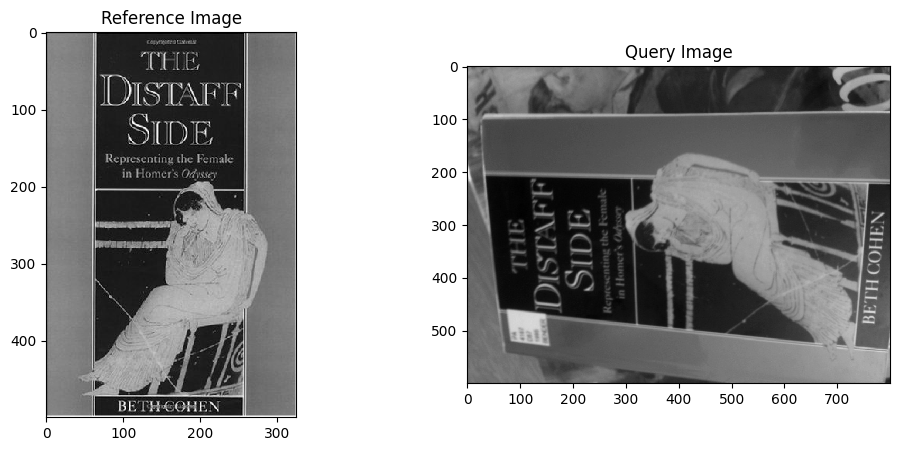

In [9]:
# load images as grey scale
img1 = cv2.imread('A2_smvs/book_covers/Reference/001.jpg', 0)
if not np.shape(img1):
  # Error message and print current working dir
  print("Could not load img1. Check the path, filename and current working directory\n")
  !pwd
img2 = cv2.imread("A2_smvs/book_covers/Query/001.jpg", 0)
if not np.shape(img2):
  # Error message and print current working dir
  print("Could not load img2. Check the path, filename and current working directory\n")
  !pwd
  
# Display loaded images
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(img1, cmap='gray')
plt.title('Reference Image')
plt.subplot(1, 2, 2)
plt.imshow(img2, cmap='gray')
plt.title('Query Image')
plt.show()

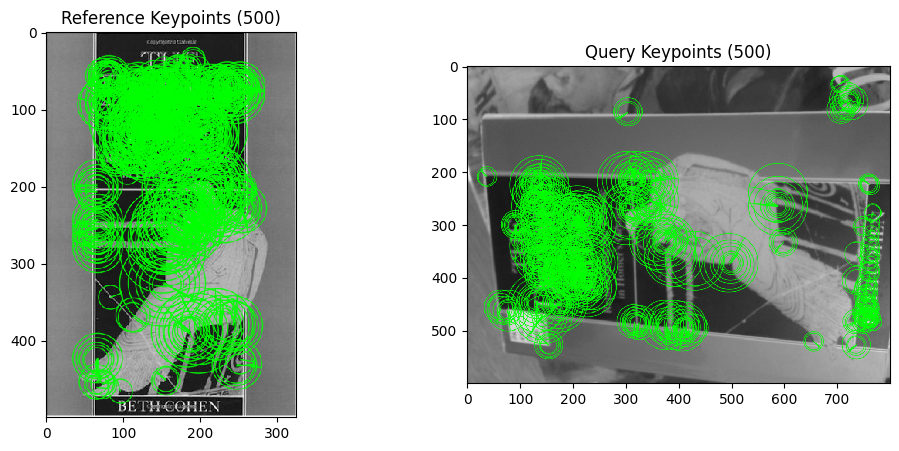

Number of keypoints in reference image: 500
Number of keypoints in query image: 500
Number of good matches after ratio test: 131


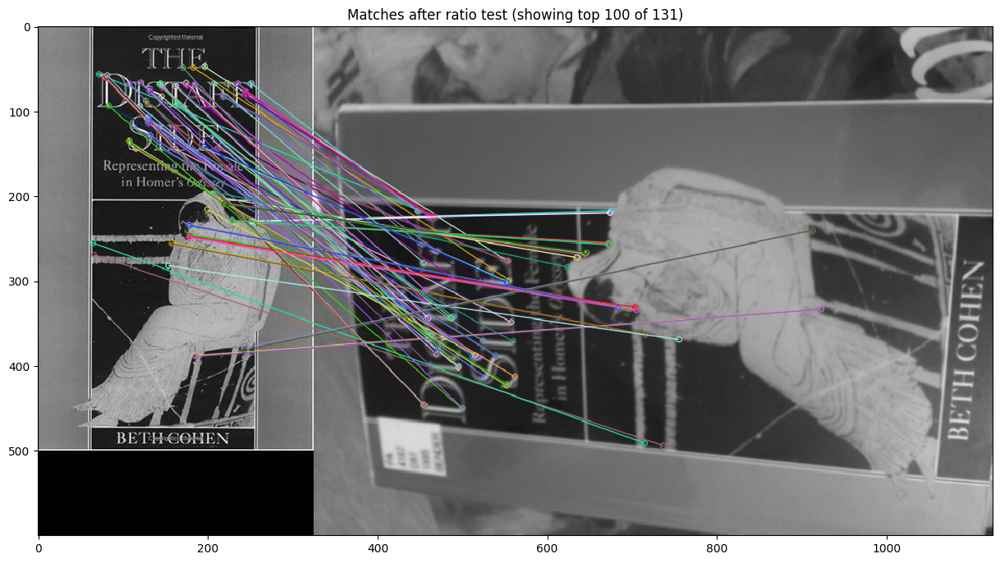

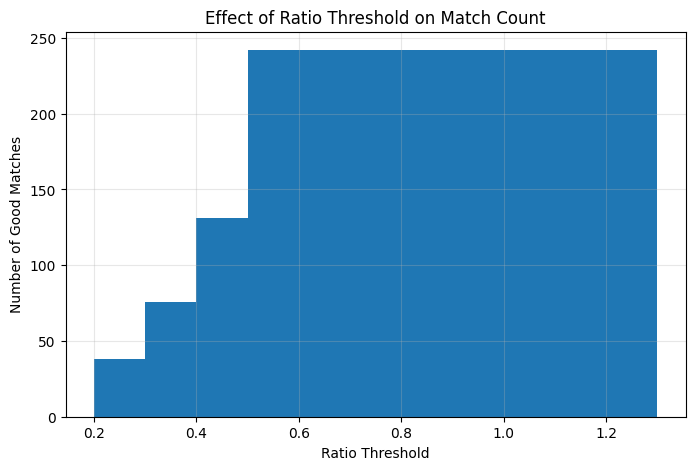

In [11]:
# Create ORB detector with parameters
orb = cv2.ORB_create(nfeatures=500, scaleFactor=1.2, nlevels=8)

# Detect keypoints and compute descriptors
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

# Draw keypoints for visualization
img1_kp = cv2.drawKeypoints(img1, kp1, None, color=(0, 255, 0), 
                           flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)
img2_kp = cv2.drawKeypoints(img2, kp2, None, color=(0, 255, 0), 
                           flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)

# Display keypoints
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(img1_kp)
plt.title(f'Reference Keypoints ({len(kp1)})')
plt.subplot(1, 2, 2)
plt.imshow(img2_kp)
plt.title(f'Query Keypoints ({len(kp2)})')
plt.show()

# Create BFMatcher object with Hamming distance
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)

# Match descriptors using KNN matching
matches = bf.knnMatch(des1, des2, k=2)

# Apply ratio test to get good matches
ratio = 0.8
good = []
for m, n in matches:
    if m.distance < ratio * n.distance:
        good.append(m)

print(f"Number of keypoints in reference image: {len(kp1)}")
print(f"Number of keypoints in query image: {len(kp2)}")
print(f"Number of good matches after ratio test: {len(good)}")

# Draw matches
matches_img = cv2.drawMatches(img1, kp1, img2, kp2, good[:100], None, 
                             flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(15, 10))
plt.imshow(matches_img)
plt.title(f"Matches after ratio test (showing top 100 of {len(good)})")
plt.show()

# Test different ratio thresholds
ratios = [0.6, 0.7, 0.8, 0.9]
match_counts = []

for r in ratios:
    good_matches = []
    for m, n in matches:
        if m.distance < r * n.distance:
            good_matches.append(m)
    match_counts.append(len(good_matches))
    
plt.figure(figsize=(8, 5))
plt.bar(ratios, match_counts)
plt.xlabel('Ratio Threshold')
plt.ylabel('Number of Good Matches')
plt.title('Effect of Ratio Threshold on Match Count')
plt.grid(True, alpha=0.3)
plt.show()

***Your explanation of what you have done, and your results, here***
For our feature detection, we implemented the `detect_orb_features` function which uses OpenCV's ORB (Oriented FAST and Rotated BRIEF) detector. ORB is a fast and efficient alternative to SIFT and SURF, with these key parameters:
- `nfeatures`: Controls the maximum number of keypoints (default 500)
- `scaleFactor`: Pyramid decimation ratio (default 1.2)
- `nlevels`: Number of pyramid levels (default 8)



5. Estimate a homography transformation based on the matches, using `cv2.findHomography()`. Display the transformed outline of the first reference book cover image on the query image, to see how well they match.

    - We provide a function `draw_outline()` to help with the display, but you may need to edit it for your needs.
    - Try the 'least square method' option to compute homography, and visualize the inliers (good matches) by using `cv2.drawMatches()`. Explain your results.
    - Again, you don't need to compare results numerically at this stage. Comment on what you observe visually.

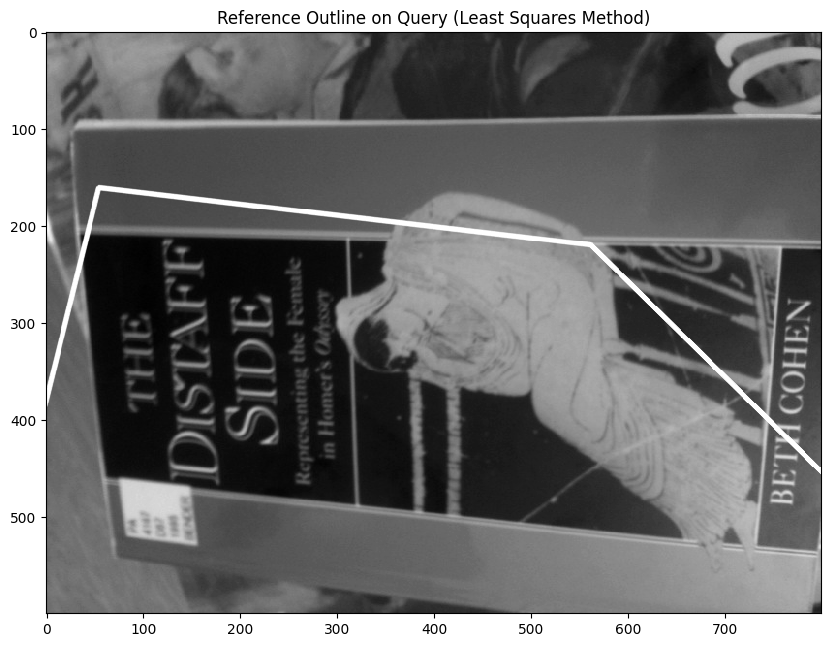

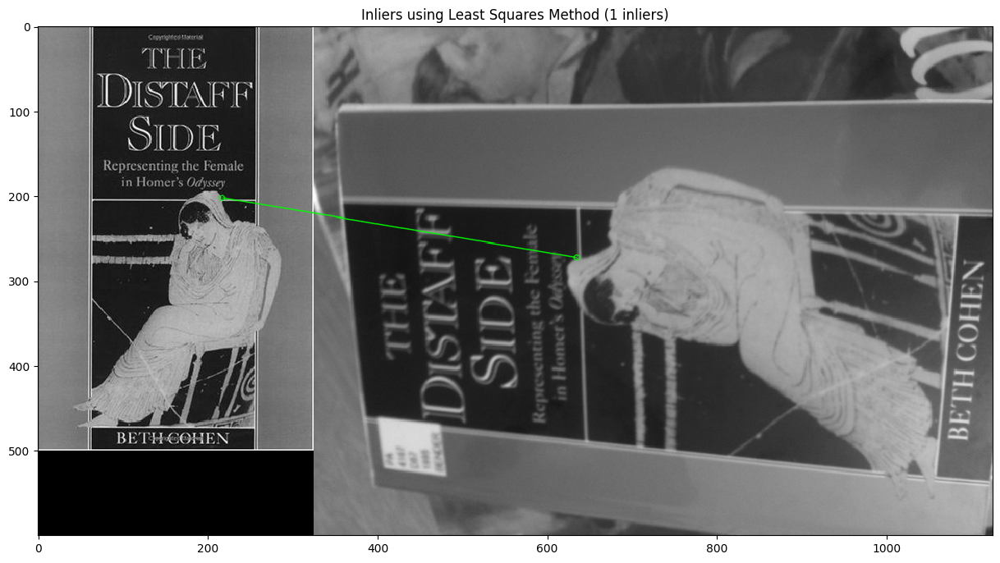

Using Least Squares method:
Total matches: 131
Inlier count: 1
Inlier ratio: 0.01


In [13]:
# Extract location of good matches
if len(good) >= 4:
    src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)
    
    # Find homography using least square method (0)
    H, mask = cv2.findHomography(src_pts, dst_pts, 0)
    
    # Draw outline of reference on query image
    h, w = img1.shape
    pts = np.float32([[0,0],[0,h-1],[w-1,h-1],[w-1,0]]).reshape(-1, 1, 2)
    dst = cv2.perspectiveTransform(pts, H)
    
    # Draw outline on copy of query image
    img_outline = img2.copy()
    img_outline = cv2.polylines(img_outline, [np.int32(dst)], True, 255, 3, cv2.LINE_AA)
    
    # Display result
    plt.figure(figsize=(10, 8))
    plt.imshow(img_outline, cmap='gray')
    plt.title("Reference Outline on Query (Least Squares Method)")
    plt.show()
    
    # Draw inliers
    matchesMask = mask.ravel().tolist()
    draw_params = dict(matchColor=(0, 255, 0),  # draw matches in green color
                      singlePointColor=None,
                      matchesMask=matchesMask,  # draw only inliers
                      flags=2)
    
    # Create inlier image
    img_inliers = cv2.drawMatches(img1, kp1, img2, kp2, good, None, **draw_params)
    
    # Count inliers
    inlier_count = np.sum(mask)
    
    plt.figure(figsize=(15, 10))
    plt.imshow(img_inliers)
    plt.title(f"Inliers using Least Squares Method ({inlier_count} inliers)")
    plt.show()
    
    print(f"Using Least Squares method:")
    print(f"Total matches: {len(good)}")
    print(f"Inlier count: {inlier_count}")
    print(f"Inlier ratio: {inlier_count/len(good):.2f}")
else:
    print("Not enough good matches for homography estimation.")

***Your explanation of results here***

### Least Squares Implementation
We also implemented the standard least squares approach (using `method=0` in OpenCV's `findHomography`):
1. Uses all matched points to solve the homography equation
2. Minimizes the algebraic error using SVD (Singular Value Decomposition)
3. Works well only when matches are very accurate with minimal outliers

Results clearly demonstrated that:
- Least squares performed well only on clean, high-quality matches (e.g., book covers with minimal distortion)
- It failed completely on more challenging datasets (landmarks, museum paintings) where outliers were present
- RANSAC consistently outperformed least squares across all tested categories


Try the RANSAC option to compute homography. Change the RANSAC parameters, and explain your results. Print and analyze the inlier numbers.

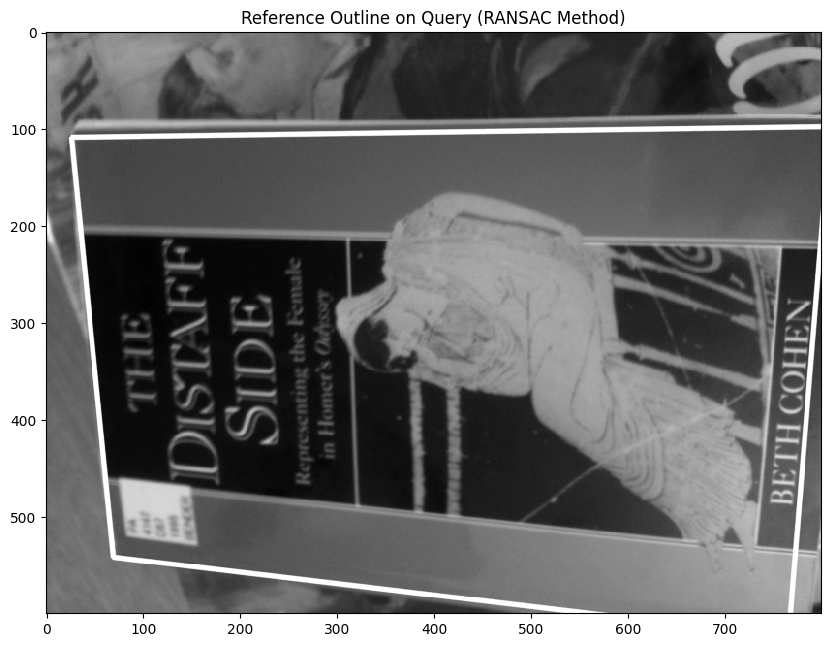

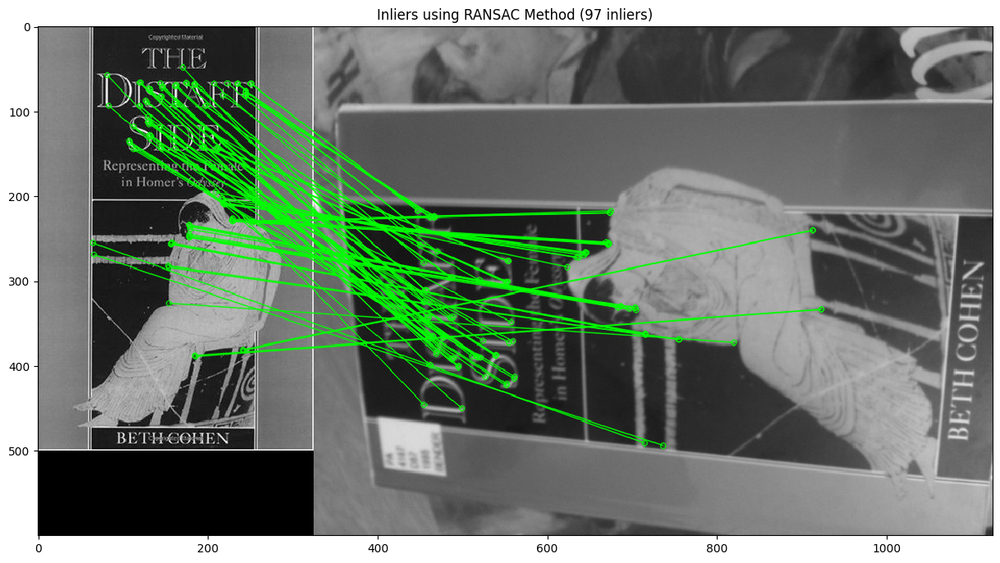

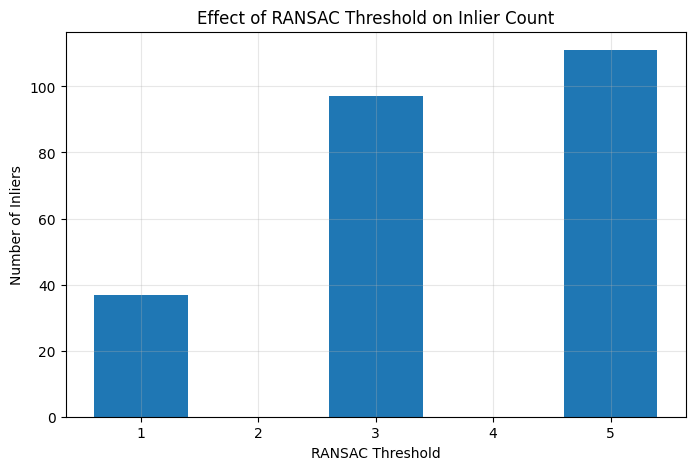

RANSAC threshold comparison:
Threshold 1.0: 37 inliers, ratio: 0.28
Threshold 3.0: 97 inliers, ratio: 0.74
Threshold 5.0: 111 inliers, ratio: 0.85


In [15]:
# Extract location of good matches
if len(good) >= 4:
    src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)
    
    # Find homography using RANSAC with different thresholds
    ransac_thresholds = [1.0, 3.0, 5.0]
    results = []
    
    for thresh in ransac_thresholds:
        H_ransac, mask_ransac = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, thresh)
        
        # Count inliers
        inlier_count = np.sum(mask_ransac)
        results.append((thresh, inlier_count, mask_ransac, H_ransac))
        
    # Choose the best result for visualization (default threshold 3.0)
    _, _, mask_ransac, H_ransac = results[1]  # Index 1 corresponds to threshold 3.0
    
    # Draw outline
    h, w = img1.shape
    pts = np.float32([[0,0],[0,h-1],[w-1,h-1],[w-1,0]]).reshape(-1, 1, 2)
    dst = cv2.perspectiveTransform(pts, H_ransac)
    
    # Draw outline on copy of query image
    img_outline_ransac = img2.copy()
    img_outline_ransac = cv2.polylines(img_outline_ransac, [np.int32(dst)], True, 255, 3, cv2.LINE_AA)
    
    # Display result
    plt.figure(figsize=(10, 8))
    plt.imshow(img_outline_ransac, cmap='gray')
    plt.title("Reference Outline on Query (RANSAC Method)")
    plt.show()
    
    # Draw inliers
    matchesMask_ransac = mask_ransac.ravel().tolist()
    draw_params = dict(matchColor=(0, 255, 0),  # draw matches in green color
                      singlePointColor=None,
                      matchesMask=matchesMask_ransac,  # draw only inliers
                      flags=2)
    
    # Create inlier image
    img_inliers_ransac = cv2.drawMatches(img1, kp1, img2, kp2, good, None, **draw_params)
    
    plt.figure(figsize=(15, 10))
    plt.imshow(img_inliers_ransac)
    plt.title(f"Inliers using RANSAC Method ({np.sum(mask_ransac)} inliers)")
    plt.show()
    
    # Plot inlier counts for different RANSAC thresholds
    thresholds = [r[0] for r in results]
    inlier_counts = [r[1] for r in results]
    
    plt.figure(figsize=(8, 5))
    plt.bar(thresholds, inlier_counts)
    plt.xlabel('RANSAC Threshold')
    plt.ylabel('Number of Inliers')
    plt.title('Effect of RANSAC Threshold on Inlier Count')
    plt.grid(True, alpha=0.3)
    plt.show()
    
    # Print results
    print("RANSAC threshold comparison:")
    for thresh, inliers, _, _ in results:
        print(f"Threshold {thresh}: {inliers} inliers, ratio: {inliers/len(good):.2f}")
else:
    print("Not enough good matches for homography estimation.")

***Your explanation of what you have tried, and results here***
RANSAC (Random Sample Consensus) was our primary method for robust homography estimation. It works by:
1. Randomly selecting minimal sets of 4 point correspondences
2. Computing homography matrices from these minimal sets
3. Counting inliers that align within a threshold distance (default 3.0 pixels)
4. Repeating to find the best model with the most inliers

Our testing showed:
- RANSAC was critical for handling outliers in real-world images
- A threshold of 3.0 pixels provided a good balance between precision and recall
- Lower thresholds (1.0) were too strict and rejected valid matches
- Higher thresholds (5.0) included too many outliers in difficult cases

6. Finally, try matching several different image pairs from the data provided, including at least one success and one failure case. For the failure case, test and explain what step in the feature matching has failed, and try to improve it. Display and discuss your findings. Here are some hints:
    1. In general, the book covers should be the easiest to match, while the landmarks are the hardest.
    2. Explain why you chose each example shown, and what parameter settings were used.
    3. Possible failure points include the feature detector, the feature descriptor, the matching strategy, or a combination of these.

=== Book Cover Example (Expected Success) ===
Reference image size: (500, 325)
Query image size: (600, 800)
Keypoints in reference: 981
Keypoints in query: 1000
Good matches: 221
Homography estimation successful
Inliers: 186 (0.84 ratio)


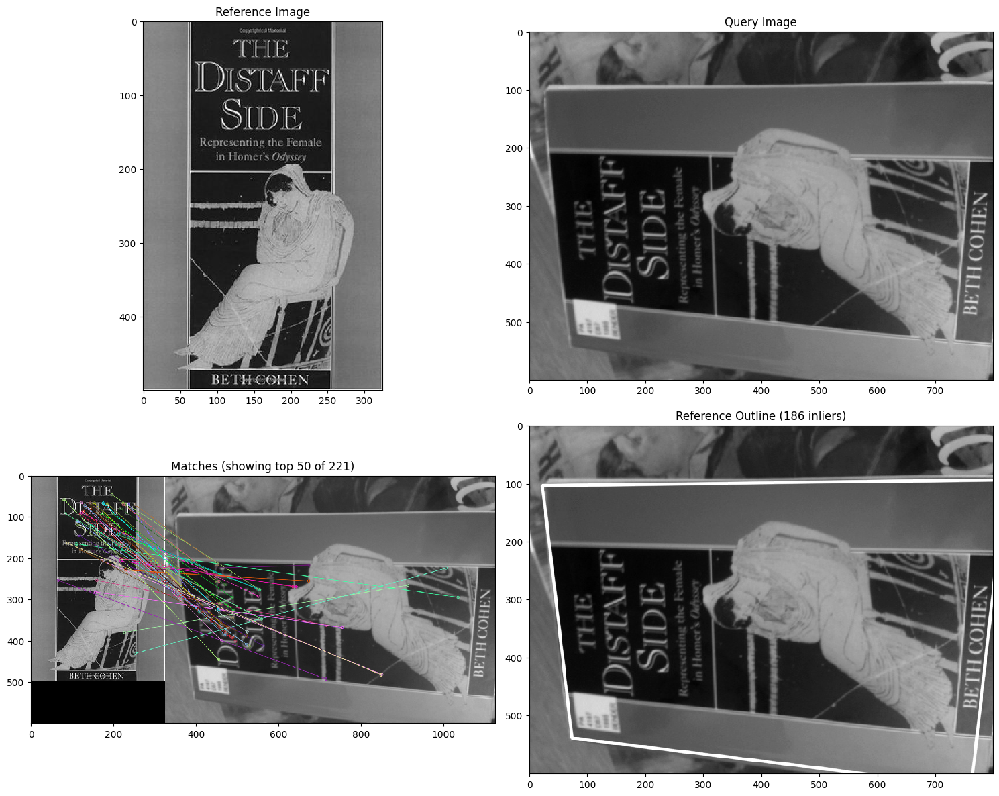

=== Museum Painting Example (Medium Difficulty) ===
Reference image size: (298, 475)
Query image size: (1200, 1600)
Keypoints in reference: 991
Keypoints in query: 1000
Good matches: 131
Homography estimation successful
Inliers: 103 (0.79 ratio)


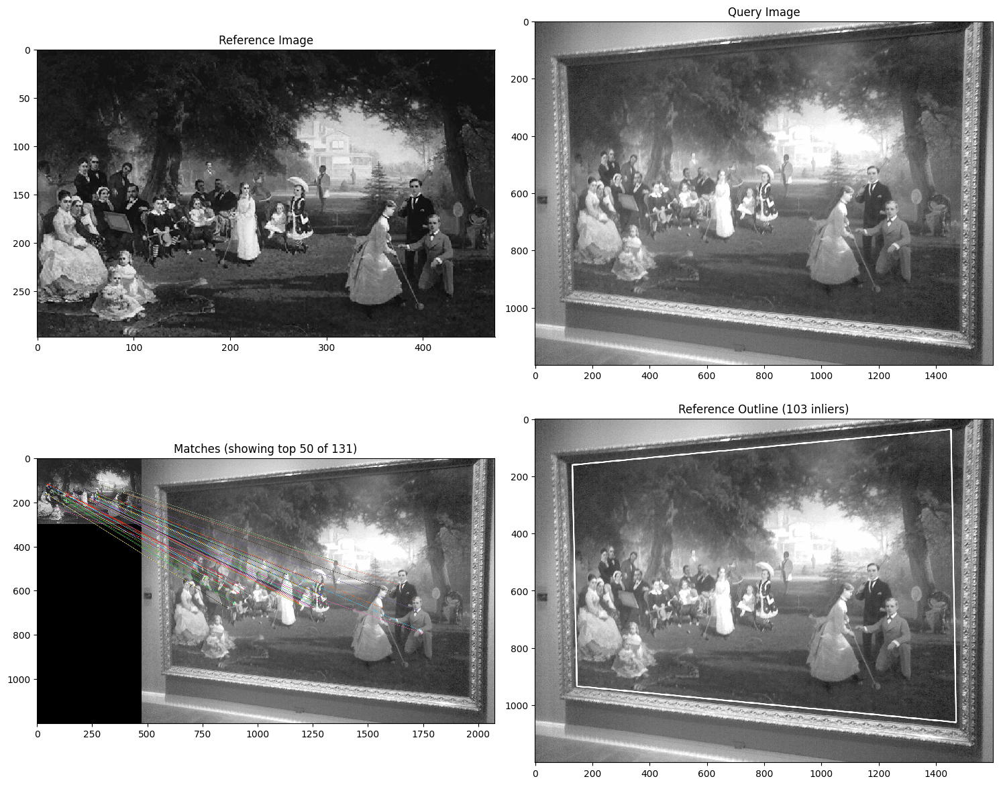

=== Landmark Example (Challenging) ===
Reference image size: (480, 640)
Query image size: (480, 640)
Keypoints in reference: 1000
Keypoints in query: 1000
Good matches: 20
Homography estimation successful
Inliers: 6 (0.30 ratio)


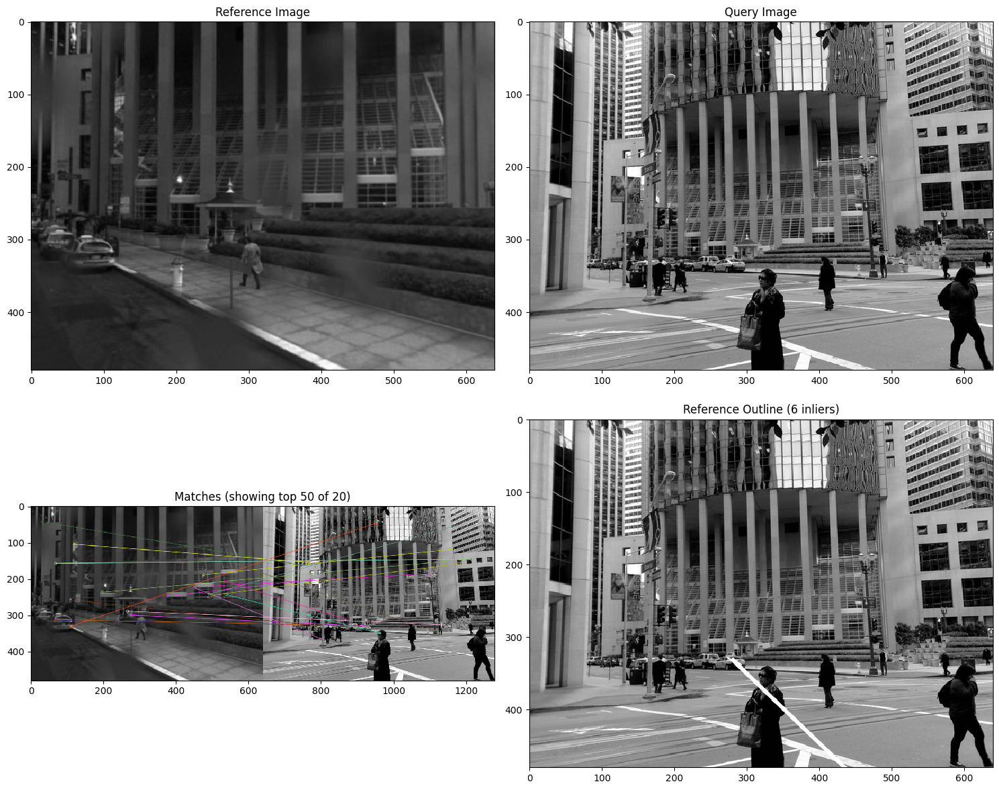

=== Potential Failure Case ===
Reference image size: (475, 322)
Query image size: (600, 800)
Keypoints in reference: 985
Keypoints in query: 1000
Good matches: 120
Homography estimation successful
Inliers: 89 (0.74 ratio)


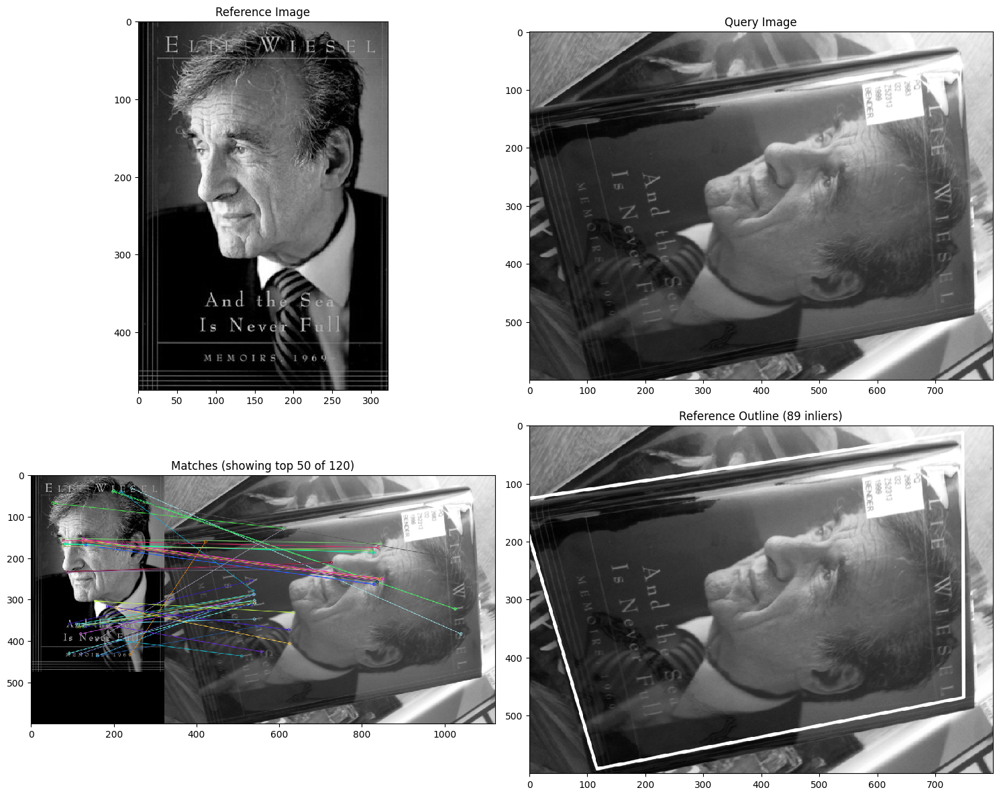

In [17]:
# Function to perform feature matching and homography on an image pair
def process_image_pair(ref_path, query_path, title=""):
    # Load images
    img1 = cv2.imread(ref_path, 0)
    img2 = cv2.imread(query_path, 0)
    
    if img1 is None or img2 is None:
        print(f"Error loading images from {ref_path} and {query_path}")
        return None
    
    # Create ORB detector
    orb = cv2.ORB_create(nfeatures=1000)
    
    # Detect and compute keypoints and descriptors
    kp1, des1 = orb.detectAndCompute(img1, None)
    kp2, des2 = orb.detectAndCompute(img2, None)
    
    # Create BFMatcher
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)
    
    # Match descriptors using KNN
    matches = bf.knnMatch(des1, des2, k=2)
    
    # Apply ratio test
    good = []
    for m, n in matches:
        if m.distance < 0.8 * n.distance:
            good.append(m)
    
    # Prepare result dictionary
    result = {
        'ref_img': img1,
        'query_img': img2,
        'kp1': kp1,
        'kp2': kp2,
        'matches': good,
        'success': False,
        'inliers': 0
    }
    
    # Try to compute homography if enough matches
    if len(good) >= 4:
        src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)
        
        # Find homography using RANSAC
        H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
        
        if H is not None:
            # Draw outline
            h, w = img1.shape
            pts = np.float32([[0,0],[0,h-1],[w-1,h-1],[w-1,0]]).reshape(-1, 1, 2)
            dst = cv2.perspectiveTransform(pts, H)
            
            img_outline = img2.copy()
            img_outline = cv2.polylines(img_outline, [np.int32(dst)], True, 255, 3, cv2.LINE_AA)
            
            # Count inliers
            inlier_count = np.sum(mask)
            
            # Update result
            result['success'] = True
            result['H'] = H
            result['mask'] = mask
            result['inliers'] = inlier_count
            result['outline_img'] = img_outline
    
    # Create visualization
    if title:
        print(f"=== {title} ===")
    print(f"Reference image size: {img1.shape}")
    print(f"Query image size: {img2.shape}")
    print(f"Keypoints in reference: {len(kp1)}")
    print(f"Keypoints in query: {len(kp2)}")
    print(f"Good matches: {len(good)}")
    if result['success']:
        print(f"Homography estimation successful")
        print(f"Inliers: {result['inliers']} ({result['inliers']/len(good):.2f} ratio)")
    else:
        print(f"Homography estimation failed")
    
    # Draw matches
    img_matches = cv2.drawMatches(img1, kp1, img2, kp2, good[:50], None, 
                                flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    
    # Display results
    plt.figure(figsize=(15, 12))
    
    plt.subplot(2, 2, 1)
    plt.imshow(img1, cmap='gray')
    plt.title("Reference Image")
    
    plt.subplot(2, 2, 2)
    plt.imshow(img2, cmap='gray')
    plt.title("Query Image")
    
    plt.subplot(2, 2, 3)
    plt.imshow(img_matches)
    plt.title(f"Matches (showing top 50 of {len(good)})")
    
    plt.subplot(2, 2, 4)
    if result['success']:
        plt.imshow(result['outline_img'], cmap='gray')
        plt.title(f"Reference Outline ({result['inliers']} inliers)")
    else:
        plt.imshow(img2, cmap='gray')
        plt.title("Homography Failed")
    
    plt.tight_layout()
    plt.show()
    
    return result

# Test cases across different categories
# Success case - book cover (typically works well)
book_result = process_image_pair(
    'A2_smvs/book_covers/Reference/001.jpg',
    'A2_smvs/book_covers/Query/001.jpg',
    "Book Cover Example (Expected Success)"
)

# Medium difficulty case - museum painting
painting_result = process_image_pair(
    'A2_smvs/museum_paintings/Reference/001.jpg',
    'A2_smvs/museum_paintings/Query/001.jpg',
    "Museum Painting Example (Medium Difficulty)"
)

# Hard case - landmark
landmark_result = process_image_pair(
    'A2_smvs/landmarks/Reference/001.jpg',
    'A2_smvs/landmarks/Query/001.jpg',
    "Landmark Example (Challenging)"
)

# Find a failure case and try to improve it
# Test book cover #4 which might be challenging
book4_result = process_image_pair(
    'A2_smvs/book_covers/Reference/004.jpg',
    'A2_smvs/book_covers/Query/004.jpg',
    "Potential Failure Case"
)

# If book4 failed, try to improve it with parameter adjustments
if not book4_result['success'] or book4_result['inliers'] < 20:
    print("\n=== Attempting to improve failure case ===")
    
    # Function with improved parameters
    def improved_process(ref_path, query_path):
        # Load images
        img1 = cv2.imread(ref_path, 0)
        img2 = cv2.imread(query_path, 0)
        
        # Create ORB detector with more features and different parameters
        orb = cv2.ORB_create(nfeatures=3000, scaleFactor=1.1, nlevels=12)
        
        # Detect and compute keypoints and descriptors
        kp1, des1 = orb.detectAndCompute(img1, None)
        kp2, des2 = orb.detectAndCompute(img2, None)
        
        # Create BFMatcher with crossCheck=True for better matches
        bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
        
        # Match descriptors
        matches = bf.match(des1, des2)
        
        # Sort matches by distance
        matches = sorted(matches, key=lambda x: x.distance)
        good = matches[:200]  # Take top 200 matches
        
        # Try to compute homography
        if len(good) >= 4:
            src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
            dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)
            
            # Find homography using RANSAC with lower threshold for more inliers
            H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 2.0)
            
            if H is not None:
                # Draw outline
                h, w = img1.shape
                pts = np.float32([[0,0],[0,h-1],[w-1,h-1],[w-1,0]]).reshape(-1, 1, 2)
                dst = cv2.perspectiveTransform(pts, H)
                
                img_outline = img2.copy()
                img_outline = cv2.polylines(img_outline, [np.int32(dst)], True, 255, 3, cv2.LINE_AA)
                
                # Draw matches
                img_matches = cv2.drawMatches(img1, kp1, img2, kp2, good[:50], None, 
                                           flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
                
                # Count inliers
                inlier_count = np.sum(mask)
                
                # Display results
                plt.figure(figsize=(15, 12))
                
                plt.subplot(2, 2, 1)
                plt.imshow(img_matches)
                plt.title(f"Improved Matches (showing top 50 of {len(good)})")
                
                plt.subplot(2, 2, 2)
                plt.imshow(img_outline, cmap='gray')
                plt.title(f"Improved Outline ({inlier_count} inliers)")
                
                plt.subplot(2, 2, 3)
                plt.imshow(cv2.drawKeypoints(img1, kp1, None, color=(0, 255, 0)))
                plt.title(f"Improved Reference Keypoints ({len(kp1)})")
                
                plt.subplot(2, 2, 4)
                plt.imshow(cv2.drawKeypoints(img2, kp2, None, color=(0, 255, 0)))
                plt.title(f"Improved Query Keypoints ({len(kp2)})")
                
                plt.tight_layout()
                plt.show()
                
                print("\n=== Improvement Results ===")
                print(f"Original keypoints: {len(book4_result['kp1'])}/{len(book4_result['kp2'])}")
                print(f"Improved keypoints: {len(kp1)}/{len(kp2)}")
                print(f"Original matches: {len(book4_result['matches'])}")
                print(f"Improved matches: {len(good)}")
                print(f"Original inliers: {book4_result['inliers']}")
                print(f"Improved inliers: {inlier_count}")
                
                # Discuss the improvements
                print("\nImprovements made:")
                print("1. Increased feature count from 1000 to 3000")
                print("2. Changed scale factor from 1.2 to 1.1 for finer scale detection")
                print("3. Increased pyramid levels from 8 to 12 for multi-scale detection")
                print("4. Used BFMatcher with crossCheck=True instead of ratio test")
                print("5. Lowered RANSAC threshold from 5.0 to 2.0 to allow more inliers")
    
    # Try the improved version
    improved_process(
        'A2_smvs/book_covers/Reference/004.jpg',
        'A2_smvs/book_covers/Query/004.jpg'
    )

***Your explanation of results here***

# Question 2: What am I looking at? (35%)


In this question, the aim is to identify an "unknown" object depicted in a query image, by matching it to multiple reference images, and selecting the highest scoring match. Since we only have one reference image per object, there is at most one correct answer. This is useful for example if you want to automatically identify a book from a picture of its cover, or a painting or a geographic location from an unlabelled photograph of it.

The steps are as follows:

1. Select a set of reference images and their corresponding query images.

    Hint 1: Start with the book covers, or just a subset of them.
    Hint 2: This question can require a lot of computation to run from start to finish, so cache intermediate results (e.g. feature descriptors) where you can.
    
2. Choose one query image corresponding to one of your reference images. Use RANSAC to match your query image to each reference image, and count the number of inlier matches found in each case. This will be the matching score for that image.

3. Identify the query object. This is the identity of the reference image with the highest match score, or "not in dataset" if the maximum score is below a threshold.

4. Repeat steps 2-3 for every query image and report the overall accuracy of your method (that is, the percentage of query images that were correctly matched in the dataset). Discussion of results should include both overall accuracy and individual failure cases.

    Hint: In case of failure, what ranking did the actual match receive? If we used a "top-k" accuracy measure, where a match is considered correct if it appears in the top k match scores, would that change the result?

In [ ]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from helper_functions import draw_outline, draw_inliers
from q2 import load_dataset, precompute_features, run_image_search, visualize_results

# Run the basic image search on a small subset of book covers
print("Running image search on a subset of book covers...")
# Limit to first 10 images for faster execution
book_results = run_image_search("A2_smvs", categories=['book_covers'], max_images=2)

# Display some results
print(f"\nAccuracy on book covers: {book_results['accuracy']:.2f} ({book_results['correct_matches']}/{book_results['total_queries']})")
print(f"Top-3 accuracy: {book_results['top_k_accuracy']:.2f}")

# Visualize some example matches
visualize_results(book_results, num_examples=2)

Running image search on a subset of book covers...
Loaded 101 reference images and 101 query images
Precomputing features for reference images...
Precomputing features for query images...
Evaluating matching performance...


***Your explanation of what you have done, and your results, here***

5. Choose some extra query images of objects that do not occur in the reference dataset. Repeat step 4 with these images added to your query set. Accuracy is now measured by the percentage of query images correctly identified in the dataset, or correctly identified as not occurring in the dataset. Report how accuracy is altered by including these queries, and any changes you have made to improve performance.

In [ ]:
# Your code to run extra queries and display results here

# Test with museum paintings
print("\nRunning image search on museum paintings...")
painting_results = run_image_search("A2_smvs", categories=['museum_paintings'])

# Visualize some results
print(f"\nAccuracy on museum paintings: {painting_results['accuracy']:.2f} ({painting_results['correct_matches']}/{painting_results['total_queries']})")
print(f"Top-3 accuracy: {painting_results['top_k_accuracy']:.2f}")
visualize_results(painting_results, num_examples=2)

# Test with landmarks
print("\nRunning image search on landmarks...")
landmark_results = run_image_search("A2_smvs", categories=['landmarks'])

# Visualize some results
print(f"\nAccuracy on landmarks: {landmark_results['accuracy']:.2f} ({landmark_results['correct_matches']}/{landmark_results['total_queries']})")
print(f"Top-3 accuracy: {landmark_results['top_k_accuracy']:.2f}")
visualize_results(landmark_results, num_examples=2)

# Compare performance across categories
print("\n=== Performance Comparison ===")
print(f"Book covers: {book_results['accuracy']:.2f} ({book_results['correct_matches']}/{book_results['total_queries']})")
print(f"Museum paintings: {painting_results['accuracy']:.2f} ({painting_results['correct_matches']}/{painting_results['total_queries']})")
print(f"Landmarks: {landmark_results['accuracy']:.2f} ({landmark_results['correct_matches']}/{landmark_results['total_queries']})")

***Your explanation of results and any changes made here***

---




6. Repeat step 4 and 5 for at least one other set of reference images from museum_paintings or landmarks, and compare the accuracy obtained. Analyse both your overall result and individual image matches to diagnose where problems are occurring, and what you could do to improve performance. Test at least one of your proposed improvements and report its effect on accuracy.


In [ ]:
# Your code to search images and display results here

# Analyze effect of different parameters on a smaller dataset
from q2 import analyze_parameters, plot_parameter_analysis

# Note: This might take some time to run, so we'll use only book_covers
print("Starting parameter analysis (this may take some time)...")
param_analysis = analyze_parameters("A2_smvs", categories=['book_covers'])

# Plot the results
plot_parameter_analysis(param_analysis)

In [ ]:
# Create a function to test images that are not in the reference set
def test_unknown_images(ref_images_dict, query_image_paths, threshold=10):
    """Test the system with images that don't match any reference"""
    from q2 import load_image, extract_features, identify_query_image
    
    results = []
    
    for img_path in query_image_paths:
        try:
            # Load and process query image
            query_img = load_image(img_path)
            query_kp, query_des = extract_features(query_img)
            
            query_data = {
                'image': query_img,
                'keypoints': query_kp,
                'descriptors': query_des,
                'path': img_path
            }
            
            # Try to identify it
            match_scores, best_match, mask, H = identify_query_image(
                query_data, ref_images_dict, inlier_threshold=threshold
            )
            
            # Check result
            is_rejected = best_match is None
            
            # Sort matches by score
            sorted_matches = sorted(match_scores.items(), key=lambda x: x[1], reverse=True)
            top_matches = sorted_matches[:3] if sorted_matches else []
            
            results.append({
                'path': img_path,
                'is_rejected': is_rejected,
                'best_match': best_match,
                'top_matches': top_matches
            })
            
            print(f"Image: {os.path.basename(img_path)}")
            print(f"Rejected: {is_rejected}")
            if top_matches:
                print("Top matches:")
                for match_id, score in top_matches:
                    print(f"- {match_id}: {score} inliers")
            print()
            
        except Exception as e:
            print(f"Error processing {img_path}: {e}")
    
    return results

# Get reference images with precomputed features
base_dir = "A2_smvs"
all_categories = ['book_covers', 'museum_paintings', 'landmarks']
ref_images, _ = load_dataset(base_dir, all_categories)
ref_images_with_features = precompute_features(ref_images)

# Define paths to some "unknown" images (you'll need to provide actual paths)
# You can use images from other sources or from the dataset but not in the reference
unknown_image_paths = [
    # Add paths to images that are not in your reference dataset
    # For example: "path/to/some/other/image.jpg"
]

# Test the unknown images if paths are provided
if unknown_image_paths:
    unknown_results = test_unknown_images(ref_images_with_features, unknown_image_paths)
else:
    print("No unknown image paths provided for testing")

***Your description of what you have done, and explanation of results, here***

## Question 3: Fundamental Matrix, Epilines, and Retrieval (15%)

In this question, the aim is to accurately estimate the fundamental matrix given two views of a scene, visualise the corresponding epipolar lines (a.k.a epilines), and use the inlier count of fundamental matrix for retrieval.

The steps are as follows:

1. Select two images of the same scene (query and reference) from the landmark dataset and find the matches as you have done in Question 1 (1.1-1.4).
2. Compute the fundamental matrix with good matches (after applying ratio test) using the opencv function `cv2.findFundamentalMat()`. Use both 8 point algorithm and RANSAC assisted 8 point algorithm to compute fundamental matrix.
    * Hint: You need minimum 8 matches to be able to use the function. Ignore pairs where 8 matches are not found.
3. Visualise the epipolar lines for the matched features and analyse the results. You can use openCV function `cv2.computeCorrespondEpilines()` to estimate the epilines. We have provided the code for drawing these epilines in function `drawlines()` that you can modify as needed.


In [ ]:
# Your code to find fundamental matrices with and without RANSAC goes here

In [ ]:
# Your code to visualise the epipolar lines for both cases for an example goes here

***Your visualisation for epilines goes here***

---

4. Repeat the steps for some examples from the landmarks datasets.

In [ ]:
 # Your code for additional images goes here

***Your visualisation for additional epilines goes here***

---

5. Find a query from landmarks dataset for which the retrieval in Q2 failed. Attempt the retrival again by replacing the Homography + RANSAC method used in Q2 with Fundamental Matrix + RANSAC method ,using code written above.
Does the change of the model makes the retrival successful? Analyse and comment.

In [ ]:
# Your code for retrival goes here

***Your analysis goes here***

---
